# Задание №1. Использование глубокой сверточной нейронной сети для классификации предметов одежды на примере датасета Fashion MNIST


[Техническая документация по датасету](https://www.kaggle.com/datasets/zalando-research/fashionmnist)

## 1.1. Устанавливаем необходимые зависимости

In [10]:
%pip install -U kaleido
import plotly.io as pio
pio.renderers.default = "png"
import kaleido
import keras.utils.np_utils
from ipython_genutils.py3compat import input
from keras.datasets import fashion_mnist # импорт исходного датасета
from keras.models import Sequential
from tqdm.keras import TqdmCallback
import pickle
from sklearn.preprocessing import LabelBinarizer

import keras
import ipyplot

import plotly.graph_objects as go
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, AveragePooling2D

from tensorflow.keras.optimizers import Adam, SGD
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

from tensorflow.python.client import device_lib
device_lib.list_local_devices()

Note: you may need to restart the kernel to use updated packages.


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 14542593838206126843,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 5717884928
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 18277926017763182241
 physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3070, pci bus id: 0000:02:00.0, compute capability: 8.6"]

## 1.2. Разделяем данные на обучающую и тестовую выборку

In [2]:
(trainX, trainY), (testX, testY) = fashion_mnist.load_data()

trainYcat = keras.utils.np_utils.to_categorical(trainY, 10)
testYcat = keras.utils.np_utils.to_categorical(testY, 10)

trainX = np.expand_dims(trainX, axis=-1)
testX = np.expand_dims(testX, axis=-1)

print('Train: X = ', trainX.shape)
print('Test: X = ', testX.shape)

Train: X =  (60000, 28, 28, 1)
Test: X =  (10000, 28, 28, 1)


## 1.3. Визуализируем часть данных из датасета

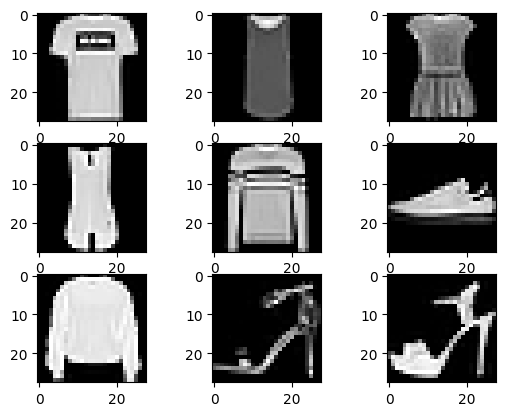

In [3]:
for i in range(1, 10):
    plt.subplot(3, 3, i)
    plt.imshow(trainX[i], cmap=plt.get_cmap('gray'))

plt.show()

## 1.4. Создаём архитектуру нейронной сети и компилируем модель

In [4]:
model = Sequential([
    Conv2D(6, (5,5), padding='same', activation='tanh', input_shape=(28, 28, 1)),
    AveragePooling2D(pool_size=(2,2), strides=(2,2)),
    Conv2D(16, (5,5), padding='same', activation='tanh'),
    AveragePooling2D(pool_size=(2,2), strides=(2,2)),

    Flatten(),

    Dense(120, activation='tanh'),
    Dense(84, activation='tanh'),
    Dense(10, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 6)         156       
_________________________________________________________________
average_pooling2d (AveragePo (None, 14, 14, 6)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 16)        2416      
_________________________________________________________________
average_pooling2d_1 (Average (None, 7, 7, 16)          0         
_________________________________________________________________
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
dense (Dense)                (None, 120)               94200     
_________________________________________________________________
dense_1 (Dense)              (None, 84)                1

## 1.5. Обучаем модель

In [5]:
LR = 0.001
model.compile(loss="categorical_crossentropy", optimizer=Adam(),
              metrics=["accuracy"])
history = model.fit(trainX, trainYcat, validation_data=(testX, testY),
                    epochs=10, batch_size=128, verbose=0, callbacks=[TqdmCallback(verbose=1)], validation_split=0.15, shuffle=True)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

## 1.5. Анализируем обученную модель. Строим график (графики) обучения

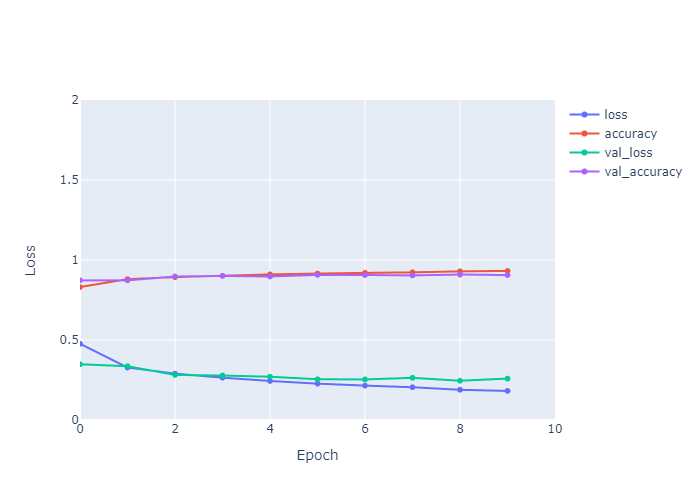

In [12]:
fig = go.Figure()

for key, _ in history.history.items():
    fig.add_trace(go.Scattergl(y=history.history[key],
                               name=key))

fig.update_layout(height=500, width=700,
                  xaxis_title='Epoch',
                  yaxis_title='Loss')

fig.update_xaxes(range=[0, 10])
fig.update_yaxes(range=[0, 2])

fig.show()

## 1.6. Загружаем свои изображения. С помощью функции predict() получаем предсказание нейронной сети

0 	T-shirt/top </br> 
1 	Trouser </br>
2 	Pullover </br>
3 	Dress </br>
4 	Coat </br>
5 	Sandal </br>
6 	Shirt </br>
7 	Sneaker </br>
8 	Bag </br>
9 	Ankle boot

In [13]:
labels = {
    0 : 'T-shirt/top',
    1 : 'Trouser',
    2 : 'Pullover',
    3 : 'Dress',
    4 : 'Coat',
    5 : 'Sandal',
    6 : 'Shirt',
    7 : 'Sneaker',
    8 : 'Bag',
    9 : 'Ankle boot'
}

In [14]:
def read_and_recognize(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (28, 28))
    
    output = img.copy()
    
    img = img.reshape(-1, 28, 28, 1)
    img = cv2.bitwise_not(img)
    preds = model.predict(img)
    
    index=preds.argmax(axis=1)[0]

    # Костыль. На Windows через раз работает str.split(os.sep)
    true_label = os.path.split(os.path.split(path)[0])[1]
    predicted_label = labels[index]

    text = ''

    if true_label != predicted_label:
        text = f'❌ {true_label}\n{preds[0][index] * 100}'
    else:
        text = f'✔️ {true_label}\n{preds[0][index] * 100}'
    return output, text
    

In [15]:
file_list = [
    './mnist_test/Ankle boot/1.jpg',
    './mnist_test/Dress/1.jpg',
    './mnist_test/Trouser/1.jpg',
    './mnist_test/Bag/1.jpg',
    './mnist_test/Pullover/1.jpg'
]

image_array = []
predictions_list = []

for file in file_list:
    image, prediction = read_and_recognize(file)
    image_array.append(image)
    predictions_list.append(prediction)

ipyplot.plot_images(image_array,predictions_list, max_images=len(file_list), img_width=200)



> Требуется получить предсказания минимум по 5 изображениям, каждое из которых относится к разному классу. Не забудьте добавить метки к каждому классу (для этого можно просто создать список строк, каждая из которых будет соответствовать классу с определенным индексом см. [тех.док.](https://www.kaggle.com/datasets/zalando-research/fashionmnist)). Процент уверенности нейронной сети в своём предсказании выводить обязательно.



# Задание №2. Использование глубокой сверточной нейронной сети для классификации изображений по своему датасету


## 2.1.  Используя датасет, собранный для предыдущей работы, разработайте и обучите **свою** модель глубокой  **сверточной** нейронной сети для классификации изображений







### Imports

In [16]:
%pip install -U kaleido
import plotly.io as pio
pio.renderers.default = "png"
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from keras.models import Sequential
from keras.layers.core import Dense
from tensorflow.keras.optimizers import SGD
from tqdm.keras import TqdmCallback
import plotly.graph_objects as go
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import random
import pickle
import cv2
import os
import plotly.io as pio
pio.renderers.default = "png"

from tensorflow.python.client import device_lib
device_lib.list_local_devices()

Note: you may need to restart the kernel to use updated packages.


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 11510457553502925898,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 5717884928
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 3662068871934955889
 physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3070, pci bus id: 0000:02:00.0, compute capability: 8.6"]

### Загрузка изображений

In [17]:
def load_n_images_with_tags(img_path: str, tag_list: list[str], count_per_tag: int):
    all_images = []

    for tag in tag_list:
        filtered_image_paths = filter(lambda x: tag in x, paths.list_images(img_path))
        image_paths = sorted(list(filtered_image_paths))[:count_per_tag]
        all_images.extend(image_paths)

    return all_images

In [18]:
path = './touhou_dataset'


imagePaths = load_n_images_with_tags(path, [
    'flandre_scarle',
    'hakurei_reimu',
    'komeiji_koishi',
    'kirisame_marisa',
    'konpaku_youmu',
    'remilia_scarlet'

], 800)

In [19]:
# Prepare image set with size 64x64
prep_path = 'prepared_dataset'
prep_path_param = '64x64'

In [ ]:
from tqdm import tqdm

for imagePath in tqdm(imagePaths, total=len(imagePaths)):
    image = cv2.imread(imagePath) # загружаем изображение
    image = cv2.resize(image, (64, 64)) # меняем его разрешение на 64x64 пикселей (без учета соотношения сторон)    

    image_path_splitted = imagePath.split(os.path.sep)

    img_name = image_path_splitted[-1]
    label = image_path_splitted[-2]

    dir_path = prep_path + '/' + prep_path_param + '/' + label
    if not os.path.exists(dir_path):
        os.mkdir(dir_path)
    
    #new_image_path = os.path.join(prep_path, prep_path_param, label, img_name)    
    # DEFAULT PYTHON PATH.JOIN() JUST DOESN'T WORK PROPERLY AND I DON'T FKCN UNDERSTAND WHY
    new_image_path = prep_path + '/' + prep_path_param + '/' + label + '/' + img_name

    cv2.imwrite(new_image_path, image)


In [20]:
# Найдём все пережатые на прошлом этапе картинки

# DEFAULT PYTHON PATH.JOIN() JUST DOESN'T WORK PROPERLY AND I DON'T FKCN UNDERSTAND WHY
path = prep_path + '/' + prep_path_param

imagePaths = sorted(list(paths.list_images(path)))

random.shuffle(imagePaths)

In [21]:
from tqdm import tqdm

data = []
labels = []

for imagePath in tqdm(imagePaths, total=len(imagePaths)):		# сглаживаем его в 64x64x3=12 288 пикселей
	image = cv2.imread(imagePath)
	data.append(image) # добавляем в список

	label = imagePath.split(os.path.sep)[-2] 	# извлекаем метку класса из пути к изображению (метка класса зависит от имени папки)
	labels.append(label) # обновляем список меток

100%|█████████████████████████████████████████████████████████████████████████████| 4800/4800 [00:24<00:00, 193.53it/s]


Нормализация данных

In [22]:
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)

Разбиваем данные на обучающую и тестовую выборки, используя 75%. Данных для обучения и оставшиеся 25% для тестирования

In [23]:
(trainX, testX, trainY, testY) = train_test_split(data,
	labels, test_size=0.25, random_state=42)

Конвертируем метки из целых чисел в векторы (для 2х классов при бинарной классификации вам следует использовать функцию Keras "to_categorical" вместо "LabelBinarizer" из scikit-learn, которая не возвращает вектор).

In [24]:
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)

In [26]:
def trainModel(model, epochs, batch_size, opt, loss_fun):
	print("[INFO] training network...")
	model.compile(loss=loss_fun, optimizer=opt,
		metrics=["accuracy"])
	
	history = model.fit(trainX, trainY, validation_data=(testX, testY),
		epochs=epochs, batch_size=batch_size, verbose=0, callbacks=[TqdmCallback(verbose=1)])
	
	fig = go.Figure()
	
	for key, _ in history.history.items():
		fig.add_trace(go.Scattergl(y=history.history[key],
			     name=key))
        
	fig.update_layout(height=500, width=700,
		   xaxis_title='Epoch',
		   yaxis_title='Loss')
	
	fig.update_xaxes(range=[0, epochs])
	fig.update_yaxes(range=[0, 2])

	fig.show()

	return model, history

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 64, 64, 32)        896       
_________________________________________________________________
average_pooling2d_2 (Average (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 64)        51264     
_________________________________________________________________
average_pooling2d_3 (Average (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 128)       204928    
_________________________________________________________________
average_pooling2d_4 (Average (None, 8, 8, 128)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)             

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

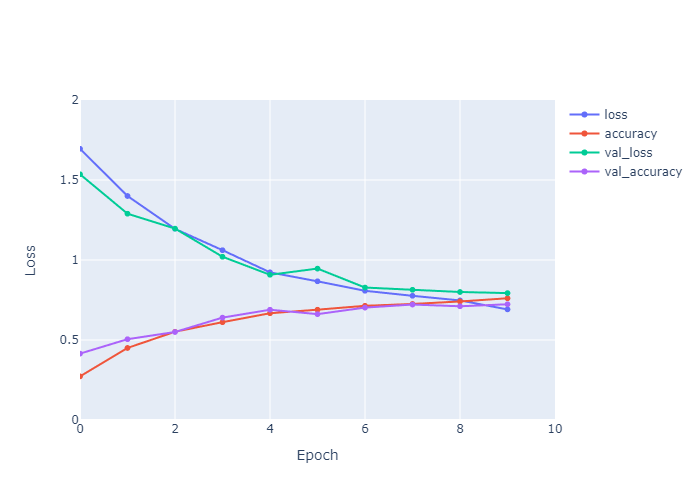

In [27]:
from tensorflow.keras.optimizers import Adamax
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, AveragePooling2D

model = Sequential([
    Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(64, 64, 3)),
    AveragePooling2D(pool_size=(2,2), strides=(2,2)),
    Conv2D(64, (5,5), padding='same', activation='relu'),
    AveragePooling2D(pool_size=(2,2), strides=(2,2)),
    Conv2D(128, (5,5), padding='same', activation='relu'),
    AveragePooling2D(pool_size=(2,2), strides=(2,2)),

    Flatten(),

    Dense(240, activation='relu'),
    Dense(120, activation='relu'),
    Dense(60, activation='relu'),
    Dense(6, activation='softmax')
])
model.summary()

model, history = trainModel(model, 
    epochs=10, 
    batch_size=100, 
    opt=Adamax(0.001), 
    loss_fun='categorical_crossentropy'
)

In [123]:
model.save("my_cnn_model.h5", save_format="h5")
f = open("my_cnn_model_labels", "wb")
f.write(pickle.dumps(lb))
f.close()

## 2.2.   Ознакомьтесь с современными архитектурами сверточных нейронных сетей: [см. ссылку](https://medium.com/aiguys/how-cnn-architectures-evolved-c53d3819fef8). На основе рассмотренных архитектур, реализуйте (частично повторяя основные паттерны проектирования) и обучите модель сверточной нейронной сети. Укажите архитектуру, которой Вы "вдохновились"

Была взята **VGG16**.
Архитектура взята [отсюда](https://mpolinowski.github.io/docs/IoT-and-Machine-Learning/ML/2023-02-18-keras-introduction-vgg16/2023-02-18/).
Что изменил:
- Урезал почти все веса в 4 раза;
- Поменял функцию активации с `relu` на `elu`
- Поменял оптимизатор с `Adam` на `Adamax`

[INFO] training network...


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

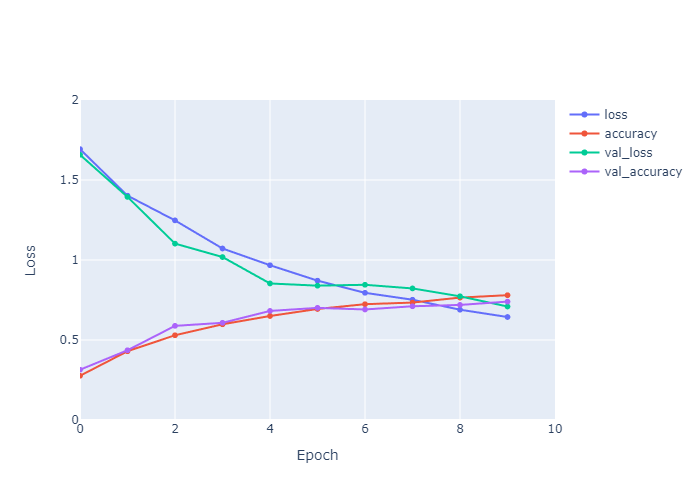

In [28]:
from tensorflow.keras.layers import Dropout
from tensorflow.keras.optimizers import Adamax

model = Sequential()
## convolutional layers with 64 filters + pooling => 224 x 224 x 64
model.add(Conv2D(16, kernel_size=(3, 3), padding='same', activation='elu', input_shape=(64, 64, 3)))
model.add(Conv2D(16, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
## randomly drop 25% of neurons to prevent overfitting
model.add(Dropout(0.25))
## convolutional layers with 128 filters + pooling => 112 x 112 x 128
model.add(Conv2D(32, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(Conv2D(32, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
## randomly drop 10% of neurons to prevent overfitting
model.add(Dropout(0.10))
## convolutional layers with 256 filters + pooling => 56 x 56 x 256
model.add(Conv2D(64, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(Conv2D(64, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(Conv2D(64, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
## randomly drop 10% of neurons to prevent overfitting
model.add(Dropout(0.10))
## convolutional layers with 256 filters + pooling => 28 x 28 x 512
model.add(Conv2D(128, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(Conv2D(128, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(Conv2D(128, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
## randomly drop 10% of neurons to prevent overfitting
model.add(Dropout(0.10))
## convolutional layers with 256 filters + pooling => 14 x 14 x 512
model.add(Conv2D(128, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(Conv2D(128, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(Conv2D(128, kernel_size=(3, 3), padding='same', activation='elu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
## randomly drop 10% of neurons to prevent overfitting
model.add(Dropout(0.10))
## flatten before dense layer => 1 x 1 x 4096
model.add(Flatten())
model.add(Dense(512, activation='elu'))
model.add(Flatten())
model.add(Dense(128, activation='elu'))
model.add(Dropout(0.25))
model.add(Dense(64, activation='elu'))
model.add(Dropout(0.25))
# output layer assigns probability of 1000 classes
model.add(Dense(6, activation='softmax'))

model, history = trainModel(model, 
    epochs=10, 
    batch_size=100, 
    opt=Adamax(0.001), 
    loss_fun='categorical_crossentropy'
)

## 2.3. Сохраните полученные модели

In [48]:
model.save("vgg16_custom_model.h5", save_format="h5")
f = open("vgg16_custom_model_labels", "wb")
f.write(pickle.dumps(lb))
f.close()

## 2.4. Загрузите обученную модель из прошлой практической работы


Замечание. В прошлой работе для достижения удовлетворительных результатов было урезано число классов (до 3) и были выбраны персонажи, которые достаточно сильно отличаются друг от друга. В ином же случае нейронка из пролого задания показывала неудовлетворительные результаты. </br>
Для чистоты эксперимента была обучена нейронная сеть с такой же архитектурой, но с теми же классами, что использовались в этой работе при обучении сверточной нейронной сети. </br>

Результаты обученной нейронки (модель `homework3_model.h5`):
- `loss`: 0.6863553
- `val_loss`: 1.094779
- `accuracy`: 0.765555
- `val_accuracy`: 0.604166

In [30]:
from keras.models import load_model
from keras import models

model_1 = models.load_model("./homework3_model.h5")
lb_1 = pickle.loads(open("./homework3_model_labels", "rb").read())


## 2.5. Сравните между собой точной всех трёх моделей, подавая на вход одинаковые изображения (15 разных изображений). Сравните предсказания каждой из моделей и сделайте выводы

In [31]:
test_data = {
    'flandre_scarlet': [
        './touhou_tests/flandre_scarlet/1.jpg',
        './touhou_tests/flandre_scarlet/2.jpg',
        './touhou_tests/flandre_scarlet/3.jpg',
        './touhou_tests/flandre_scarlet/4.jpg',
        './touhou_tests/flandre_scarlet/5.jpg'
    ],

    'hakurei_reimu': [
        './touhou_tests/hakurei_reimu/1.jpg',
        './touhou_tests/hakurei_reimu/2.jpg',
        './touhou_tests/hakurei_reimu/3.jpg',
        './touhou_tests/hakurei_reimu/4.jpg',
        './touhou_tests/hakurei_reimu/5.jpg'
    ],

    'komeiji_koishi': [
        './touhou_tests/komeiji_koishi/1.jpg',
        './touhou_tests/komeiji_koishi/2.jpg',
        './touhou_tests/komeiji_koishi/3.jpg',
        './touhou_tests/komeiji_koishi/4.jpg',
        './touhou_tests/komeiji_koishi/5.jpg'
    ],

    'kirisame_marisa': [
        './touhou_tests/kirisame_marisa/1.jpg',
        './touhou_tests/kirisame_marisa/2.jpg',
        './touhou_tests/kirisame_marisa/3.jpg',
        './touhou_tests/kirisame_marisa/4.jpg',
        './touhou_tests/kirisame_marisa/5.jpg'
    ],

    'konpaku_youmu': [
        './touhou_tests/konpaku_youmu/1.jpg',
        './touhou_tests/konpaku_youmu/2.jpg',
        './touhou_tests/konpaku_youmu/3.jpg',
        './touhou_tests/konpaku_youmu/4.jpg',
        './touhou_tests/konpaku_youmu/5.jpg'
    ],

    'remilia_scarlet': [
        './touhou_tests/remilia_scarlet/1.jpg',
        './touhou_tests/remilia_scarlet/2.jpg',
        './touhou_tests/remilia_scarlet/3.jpg',
        './touhou_tests/remilia_scarlet/4.jpg',
        './touhou_tests/remilia_scarlet/5.jpg'
    ]
}

In [32]:
labels = [
    'flandre_scarlet',
    'hakurei_reimu',
    'komeiji_koishi',
    'kirisame_marisa',
    'konpaku_youmu',
    'remilia_scarlet'
]

In [33]:
def predict(imagepath: str, model, flatten: bool):
    image = cv2.imread(imagepath)
    image = cv2.resize(image, (64, 64))
    
    if flatten:
        image = image.flatten()
        image = image.reshape((1, image.shape[0]))
    else:
        image = image.reshape(1, image.shape[0], image.shape[0], 3)

    image = image.astype("float") / 255.0

    return model.predict(image)

In [34]:
import numpy as np
from keras import models   
import ipyplot
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def test(labels: str, model_path: str, labels_path: str, flatten: bool):

    model = models.load_model(model_path)
    lb = pickle.loads(open(labels_path, "rb").read())

    error_matrix = np.zeros(shape=(len(lb.classes_), len(lb.classes_)))

    for label in labels:
        image_array = []
        predictions_list = []
        test_images = test_data[label]

        for image in test_images:
            # по умолчанию в opencv каналы в порядке BGR. для вывода поменяем их на RGB
            # также уменьшим изображение
            output = cv2.imread(image)
            output = cv2.resize(output, (200, 200))
            output = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

            prediction = predict(image, model, flatten)

            i = prediction.argmax(axis=1)[0]
            predicted_label = lb.classes_[i]

            prediction_text = ''

            if predicted_label != label:
                corr_i = np.where(lb.classes_ == label)[0][0]

                prediction_text = f'❌ - {predicted_label:20}\n{prediction[0][i]}'
                error_matrix[corr_i][i] += 1
            else:
                prediction_text = f'✔️ - {label:20}\n{prediction[0][i]}'
                error_matrix[i][i] += 1


            image_array.append(output)
            predictions_list.append(prediction_text)

        ipyplot.plot_images(image_array,predictions_list, max_images=len(test_images), img_width=200)

    disp = ConfusionMatrixDisplay(confusion_matrix=error_matrix, display_labels=labels)
    disp.plot()
    plt.show()
    

### Модель из прошлого задания


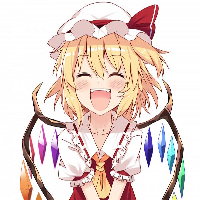
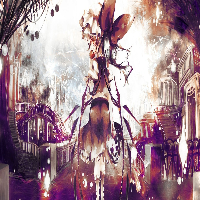
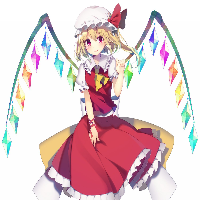
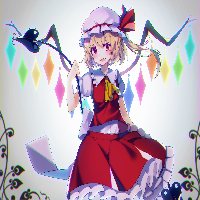
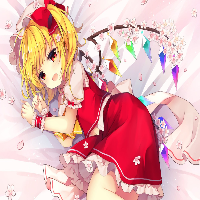


...
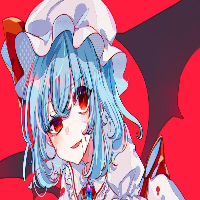
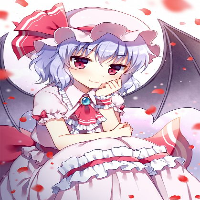
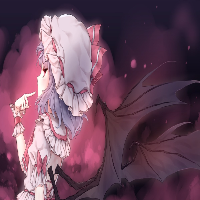
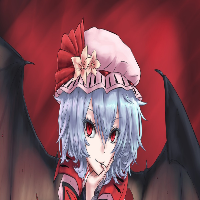

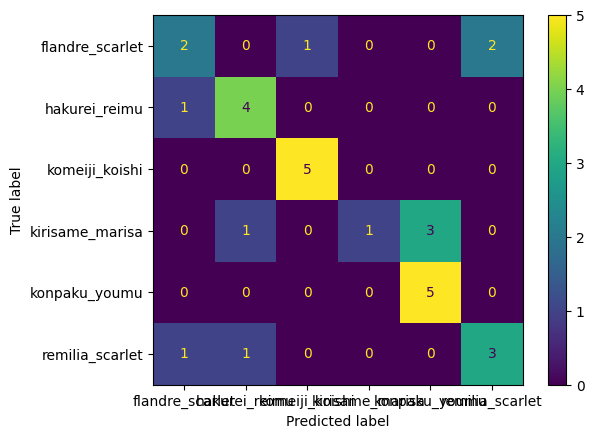

In [35]:
test(labels, './homework3_model.h5', './homework3_model_labels', flatten=True)

### Глубокая сверточная нейронная сеть. Своя архитектура


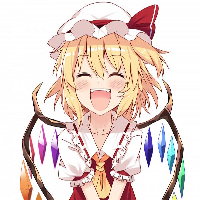
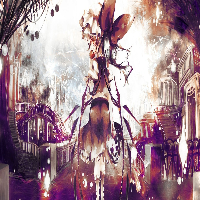
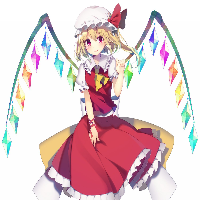
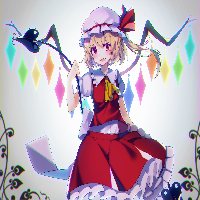
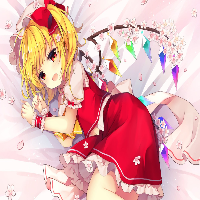


...
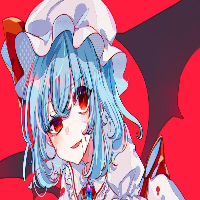
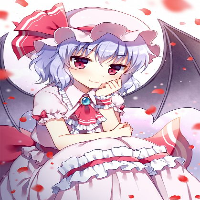
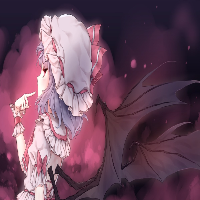
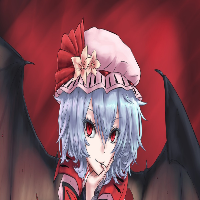

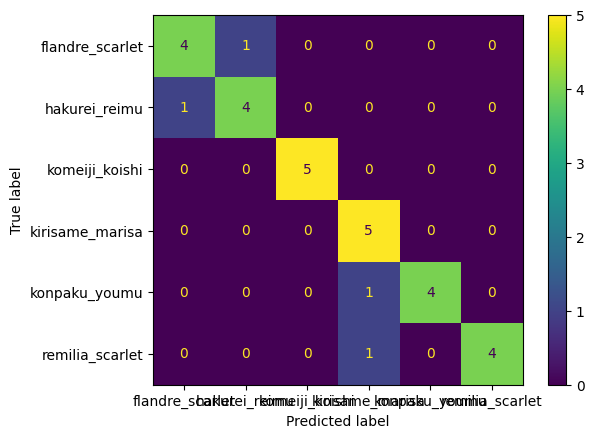

In [36]:
test(labels, './my_cnn_model.h5', './my_cnn_model_labels', flatten=False)

### Глубокая сверточная нейронная сеть. VGG16 с правками


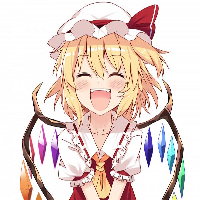
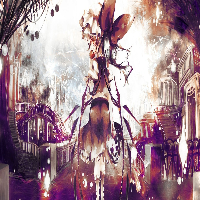
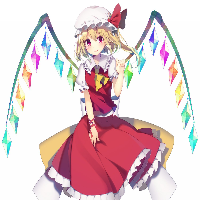
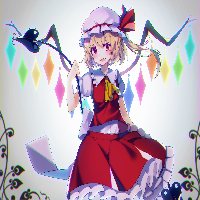
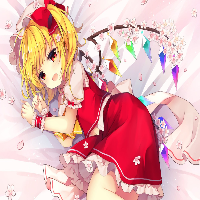


...
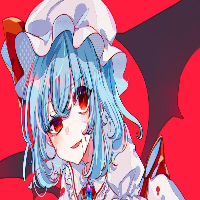
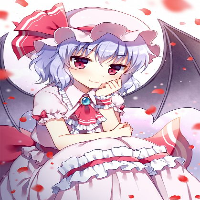
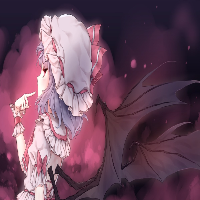
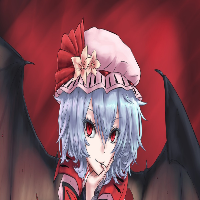

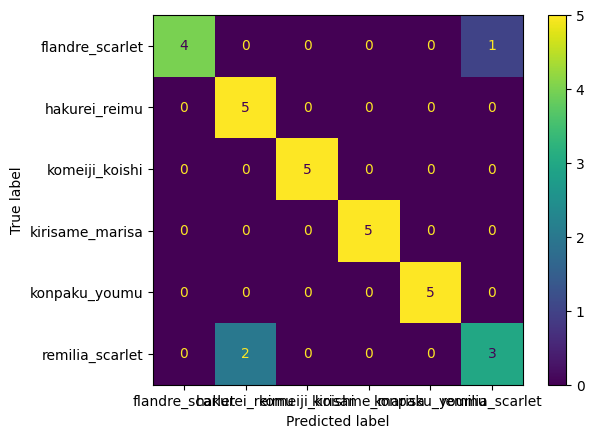

In [37]:
test(labels, './vgg16_custom_model.h5', './vgg16_custom_model_labels', flatten=False)

### Вывод
Обе сверточные нейронные сети показали себя заметно лучше, чем нейронная сеть из прошлой работы. При этом они занимают заметно меньше места на диске:
- `homework3_model.h5` - 107 560 KB
- `my_cnn_model.h5` - 26 551 KB
- `vgg16_custom_model.h5` - 14 901 KB



# Задание №3*. Использование глубокой сверточной нейронной сети для восстановления изображения

## 3.1. Работа с данными

Будем работать с набором данным `fetch_olivetti_faces` из `sklearn`.

### 3.1.1. Переведите векторы в настоящие изображения из двух размерностей

In [101]:
from sklearn.datasets import fetch_olivetti_faces
from sklearn.model_selection import train_test_split

data, _ = fetch_olivetti_faces(return_X_y=True)
train, test = train_test_split(data, test_size=0.2, random_state=4)

In [102]:
train.shape

(320, 4096)

Сейчас изображение - это вектор, имеющий размерность 4096.

In [103]:
train = train.reshape((train.shape[0], 64, 64))
test = test.reshape((test.shape[0], 64, 64))

test.shape

(80, 64, 64)

### 3.1.2. Отрисуйте несколько примеров

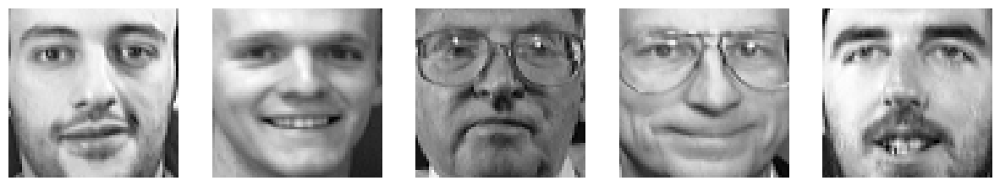

In [104]:
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 5, figsize=(15, 10))

for i in range(5):
    ax[i].imshow(train[i], cmap='gray')
    ax[i].axis('off')

Поделим данные на X и y, где X - это верхняя часть лица человека, на этом модель будет обучаться, а y - это нижняя часть лица человека - её будем предсказывать.

In [105]:
n_pixels = train.shape[1]

# Upper half of the faces
X_train = train[:, :(n_pixels + 1) // 2, :]
# Lower half of the faces
y_train = train[:, n_pixels // 2:, :]


X_test = test[:, :(n_pixels + 1) // 2, :]
y_test = test[:, n_pixels // 2:, :]

In [186]:
X_train.shape

(320, 32, 64, 1)

Вот один пример обучающей пары.

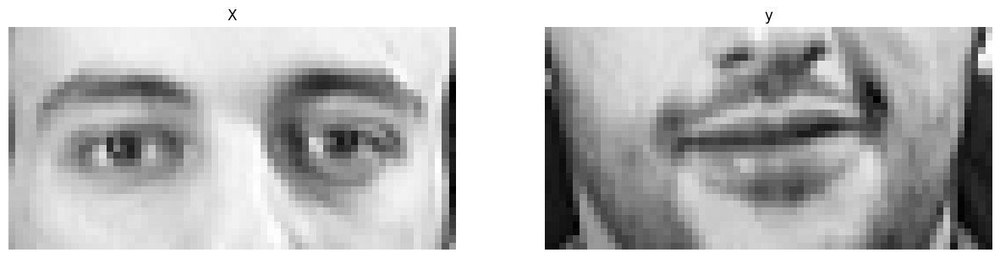

In [107]:
import matplotlib.pyplot as plt

idx = 0

fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(X_train[idx], cmap='gray')
ax[0].set_title('X')
ax[1].imshow(y_train[idx], cmap='gray')
ax[1].set_title('y')
ax[0].axis('off')
ax[1].axis('off')

plt.show()

### 3.1.3. Измените размерность y
Остается только изменить размерность y, т.к. сейчас $y$ - картинка 32x64, а выход нейронной сети у нас будет одномерный и равный 32 * 64 = 2048. 

In [108]:
y_train_n = y_train.reshape(y_train.shape[0], 32 * 64)
y_test_n = y_test.reshape(y_test.shape[0], 32 * 64)

y_train_n.shape

(320, 2048)

In [109]:
X_train = np.array(X_train).astype('float32')
X_test = np.array(X_test).astype('float32')
y_train = np.array(y_train).astype('float32')
y_test = np.array(y_test).astype('float32')

X_train = np.expand_dims(X_train, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)
y_train = np.expand_dims(y_train, axis=-1)
y_test = np.expand_dims(y_test, axis=-1)

In [110]:
X_train.shape

(320, 32, 64, 1)

## 3.2. Создайте архитектуру для этой задачи

In [208]:
from tensorflow.keras.optimizers import Adamax
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, AveragePooling2D

model = Sequential([
    Conv2D(512, (3,3), padding='same', activation='relu', input_shape=(32, 64, 1)),
    MaxPooling2D(pool_size=(2,2), strides=(2,2)),
    Conv2D(256, (5,5), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(2,2), strides=(2,2)),
    Conv2D(128, (5,5), padding='same', activation='relu'),

    Flatten(),
    
#    Dense(4096, activation='relu'),
    Dense(2048, activation='sigmoid')
])
model.summary()

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_72 (Conv2D)           (None, 32, 64, 512)       5120      
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 16, 32, 512)       0         
_________________________________________________________________
conv2d_73 (Conv2D)           (None, 16, 32, 256)       3277056   
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 8, 16, 256)        0         
_________________________________________________________________
conv2d_74 (Conv2D)           (None, 8, 16, 128)        819328    
_________________________________________________________________
flatten_22 (Flatten)         (None, 16384)             0         
_________________________________________________________________
dense_65 (Dense)             (None, 2048)            

## 3.3. Скомпилируйте сеть

Подберите нужную функцию потерь и метрику. Оптимизатор можете использовать 'adam'

In [209]:
model.compile(loss='binary_crossentropy', optimizer=Adamax(0.001),
		metrics=['binary_crossentropy'])

## 3.4. Обучите нейросеть

Выберите нужное количество эпох.


In [210]:
EPOCHS=100

history = model.fit(X_train, y_train_n, validation_data=(X_test, y_test_n),
	epochs=EPOCHS, batch_size=30, verbose=0, callbacks=[TqdmCallback(verbose=1)])

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

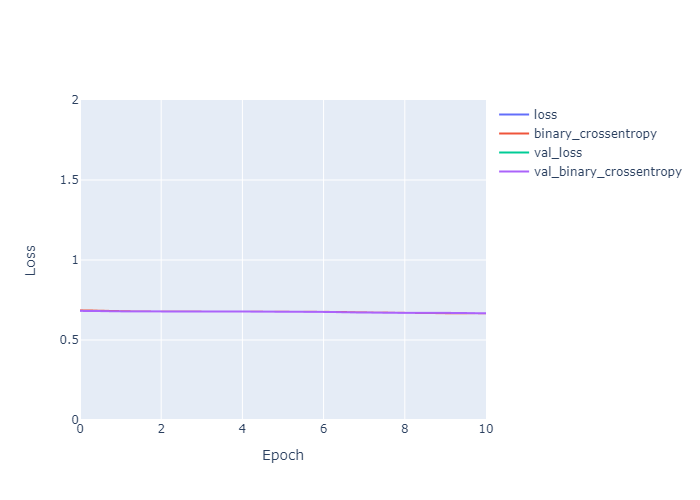

In [211]:
fig = go.Figure()

for key, _ in history.history.items():
    fig.add_trace(go.Scattergl(y=history.history[key],
                               name=key))

fig.update_layout(height=500, width=700,
                  xaxis_title='Epoch',
                  yaxis_title='Loss')

fig.update_xaxes(range=[0, 10])
fig.update_yaxes(range=[0, 2])

fig.show()

## 3.5. Сделайте предсказания на тестовых данных

In [212]:
preds = model.predict(X_test)

## 3.6. Посчитайте метрику качества на тестовых данных

In [213]:
from sklearn.metrics import mean_absolute_error

mean_absolute_error(preds, y_test_n)

0.07293601

## 3.7. Преобразуйте предсказанные векторы в двумерное изображение (поменяйте их размерность)


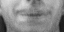
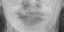
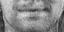
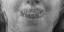
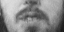
...
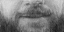
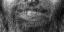
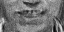
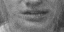
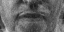

In [214]:
preds = np.array([pred.reshape((32, 64)) for pred in preds])

img_count = 10

ipyplot.plot_images(preds[:img_count], [str(x) for x in range(img_count)], max_images=img_count, img_width=200)
plt.show()

Отрисуйте все предсказания.

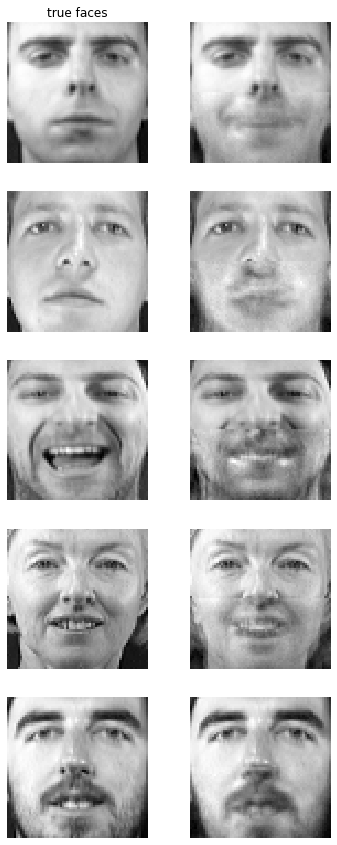

In [ ]:
# Пример кода:

n_faces = 5
n_cols = 2
image_shape = (64, 64)
plt.figure(figsize=(3 * n_cols, 3 * n_faces))


for i in range(5):
    true_face = np.vstack((X_test[i], y_test[i]))

    if i:
        sub = plt.subplot(n_faces, n_cols, i * n_cols + 1)
    else:
        sub = plt.subplot(n_faces, n_cols, i * n_cols + 1, title="true faces")

    sub.axis("off")
    sub.imshow(
        true_face.reshape(image_shape), cmap=plt.cm.gray, interpolation="nearest"
    )

    completed_face = np.vstack((X_test[i], pred_test[i]))

    if i:
        sub = plt.subplot(n_faces, n_cols, i * n_cols + 2)

    else:
        sub = plt.subplot(n_faces, n_cols, i * n_cols + 2)

    sub.axis("off")
    sub.imshow(
        completed_face.reshape(image_shape),
        cmap=plt.cm.gray,
        interpolation="nearest",
    )